# 13. Define Color Channels
We use scans of Munsell's Soil Chart colors and the python package Open Computer Vision (OpenCV) to extract a numeric values for color ranges in computer readable language. We are interested in any color with "green" or "olive" in the name.
<br><br>
![RGB vs HSV](Images/RGBvHSV.JPG) <div style='text-align: right'> Source [miro.medium.com](https://miro.medium.com/max/1700/1*W30TLUP9avQwyyLfwu7WYA.jpeg) </div> 
<br><br>
Most computer programs use Red-Green-Blue (RGB) values to represent additive mixtures of red, green, and blue light that make the spectrum of colors on a screen (a, left). These are typically stored as sets of 3 integers, one for R, G, and B, with values between 0-255. This model for color works additively. This means if all values were set to zero, you would have black. The blacks on this cube are on the back part, which we can't see. If you set all values to the maximum, you would have white.
<br><br>
The challenge with RGB light is the model is the way light mixes is not very intuitive. The Hue-Saturation-Value system improves upon this. Hue is represented by an angle between 0-360$^o$, representing the basic divisions of the visible light spectrum. Saturation is a radial distance from the center line of a circle. A saturation of 0 would be grey, and located in the circles center. Full saturation of the color would be on the circle's edge. Value adds a heigh dimension to the cirlce, making a cylinder. Low value colors are dark, and high value colors are light.
<br><br>
The Munsell color scheme works similarly to the HSV system. The three parameters are Hue, Chroma, and Value. Hues are defined with letters representing colors or mixtures of colors. For example, Y is a yellow hue, and GY is a green-yellow hue. There is a number appended the the beginning of the hue's letter to add provide additional detail of the where the hue lies on the visible light specture (e.g. 2.5Y, 5Y, 10Y). Chroma represents the color's saturation, and value represents how light the color is. The main difference is that the HSV system was designed to create and mix light on a computer screen, while the Munsell system is designed to represent the colors of things in 3 dimensional space, which are very dependent on lighting and context. 
<br><br>
We use scans from the Munsell soil colors, accepting this caveat that it might not perfectly represent the design intended by the palette.

This notebook produces Supplementary Figure 4, 6A, and 6B, and Supplementary table 4

## Setup
### Import Modules

In [6]:
from mpl_toolkits import mplot3d
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from ast import literal_eval
import os
from IPython.display import clear_output
import colorsys
import cv2 as cv
from pdf2image import convert_from_path
import matplotlib.patches as patches

### File Paths

In [1]:
data_path='/Users/danielbabin/GitHub/Green_Bands/Data/'
table_path='/Users/danielbabin/GitHub/Green_Bands/Tables/'
checkpoints_path='/Users/danielbabin/GitHub/Green_Bands/Data/Checkpoints/'
figure_path='/Users/danielbabin/GitHub/Green_Bands/Figures/Main'
sup_figure_path='/Users/danielbabin/GitHub/Green_Bands/Figures/Supplementary/'

## Get Colors from Pictures
There are three panels from the soil color chart that include greens and olives. The code below just goes through all of these and sets boundaries that identify the squares of color, and takes and average of the HSV values for pixels across those squares, and stores them.
### Import Palettes

In [2]:
palette_in='/Users/danielbabin/GitHub/Green_Bands/Documents/Munsell Color Charts/PDFs/'
palette_out='/Users/danielbabin/GitHub/Green_Bands/Documents/Munsell Color Charts/JPGs/'

In [3]:
palette_names=['2.5Y','5Y','10Y-5GY','GLEY1','GLEY2']

In [4]:
def convert_save(name):
    palette=convert_from_path(palette_in+name+'.pdf',600)[0]
    palette.save(palette_out+name+'.jpg', 'JPEG')
def import_palettes(name):
    palettes[name]={}
    palettes[name]['BGR']=cv.imread(palette_out+name+'.jpg',1)
    palettes[name]['HSV']=cv.cvtColor(palettes[name]['BGR'],cv.COLOR_BGR2HSV)
    palettes[name]['RGB']=cv.cvtColor(palettes[name]['BGR'],cv.COLOR_BGR2RGB)   

In [7]:
palettes={}
for i,name in enumerate(palette_names):
    clear_output(wait=True)
    convert_save(name)
    import_palettes(name)
    print(name)

GLEY2


In [8]:
palettes.keys()

dict_keys(['2.5Y', '5Y', '10Y-5GY', 'GLEY1', 'GLEY2'])

### 2.5Y

#### Photo

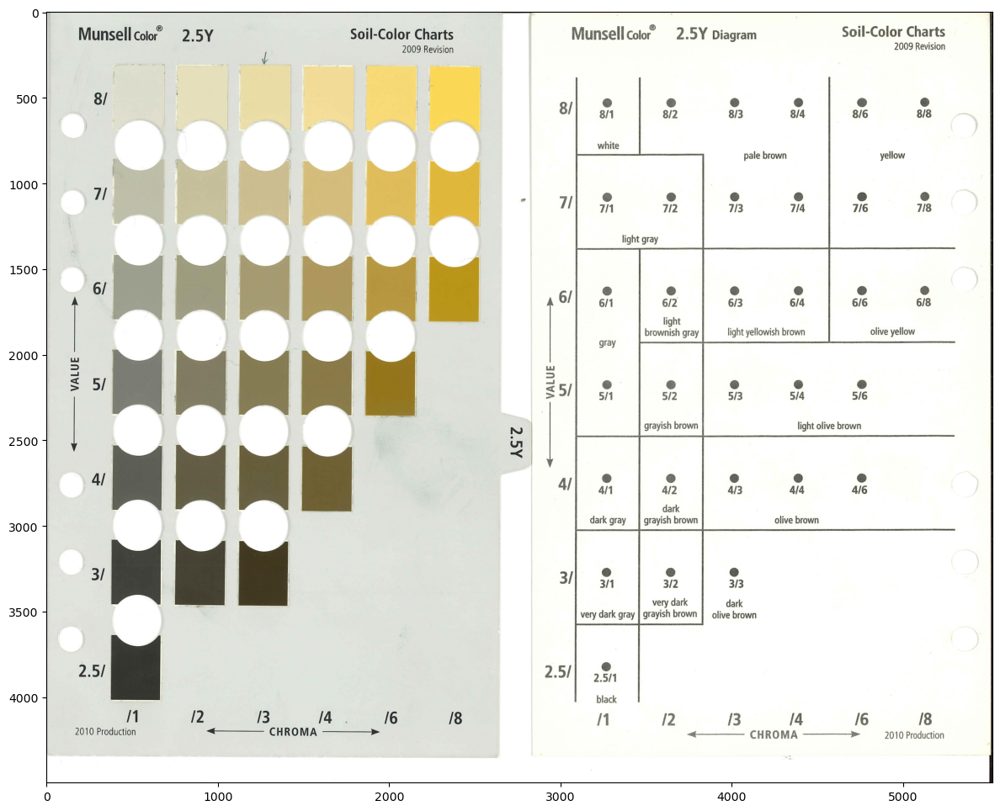

In [9]:
fig,ax=plt.subplots(figsize=(9.2*1.3,7.5*1.3))
ax.imshow(palettes['2.5Y']['RGB'])
plt.tight_layout()

#### Square Boundaries

In [10]:
w=240
wstarts=[420,775,1150,1520,1880,2250]
widths=[tuple((n,n+w)) for n in wstarts]

In [11]:
h=210
hstarts=[350,940,1500,2050,2600,3150,3740]
heights=[tuple((n,n+w)) for n in hstarts]

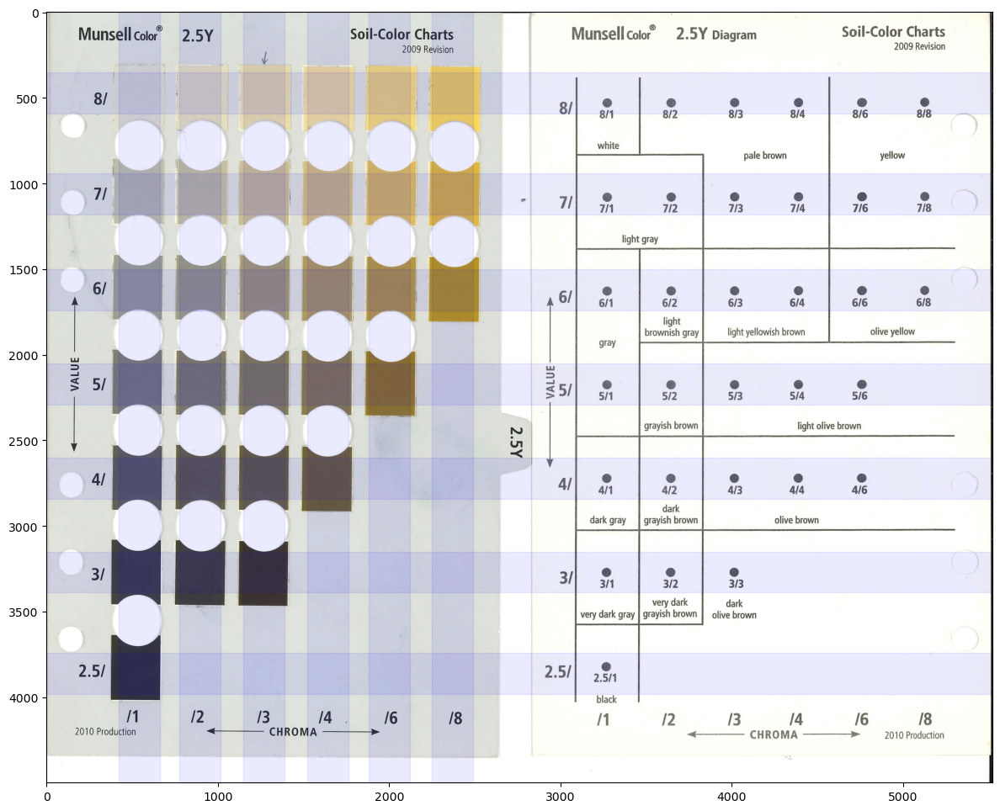

In [12]:
fig,ax=plt.subplots(figsize=(9.2*1.3,7.5*1.3))
ax.imshow(palettes['2.5Y']['RGB'])
for height in heights:
    ax.axhspan(ymin=height[0],ymax=height[1],color='b',alpha=.08)
for width in widths:
    ax.axvspan(xmin=width[0],xmax=width[1],color='b',alpha=.08)
plt.tight_layout()

#### Take average and store results

In [13]:
palettes['2.5Y']['Values']=np.zeros((7,6,3))

In [14]:
for i,height in enumerate(heights):
    for j,width in enumerate(widths):
        palettes['2.5Y']['Values'][i,j]=palettes['2.5Y']['HSV'][height[0]:
                                                                height[1],
                                                                width[0]:
                                                                width[1]].mean(axis=0).mean(axis=0).astype(int)

In [15]:
palettes['2.5Y']['Names']=['white 2.5Y 8/1','pale brown 2.5Y 8/2','pale brown 2.5Y 8/3',
                           'pale brown 2.5Y 8/4','yellow 2.5Y 8/6','yellow 2.5Y 8/8',
                           
                           'light gray 2.5Y 7/1','light gray 2.5Y 7/2','pale brown 2.5Y 7/3',
                           'pale brown 2.5Y 7/4','yellow 2.5Y 7/6','yellow 2.5Y 7/8',
                           
                           'gray 2.5Y 6/1','light brownish gray 2.5Y 6/2','light yellowish brown 2.5Y 6/3',
                           'light yellowish brown 2.5Y 6/4','olive yellow 2.5Y 6/6','olive yellow 2.5Y 6/8',
                           
                           'gray 2.5Y 5/1','grayish brown 2.5Y 5/2','light olive brown 2.5Y 5/3',
                           'light olive brown 2.5Y 5/4','light olive brown 2.5Y 5/6','',
                           
                           'dark gray 2.5Y 4/1','dark grayish brown 2.5Y 4/2','olive brown 2.5Y 4/3',
                           'olive brown 2.5Y 4/4','olive brown 2.5Y 4/6','',
                           
                           'very dark gray 2.5Y 3/1','very dark grayish brown 2.5Y 3/2','dark olive brown 2.5Y 3/3',
                           '','','',
                           
                           'black 2.5Y 2.5/1','','','','','']

In [16]:
flatYs2p5=palettes['2.5Y']['Values'].reshape(42,3)

In [17]:
flatYs2p5df=pd.DataFrame({'H':flatYs2p5[:,0],'S':flatYs2p5[:,1],'V':flatYs2p5[:,2],
                          'Name':palettes['2.5Y']['Names']})

### 5Y

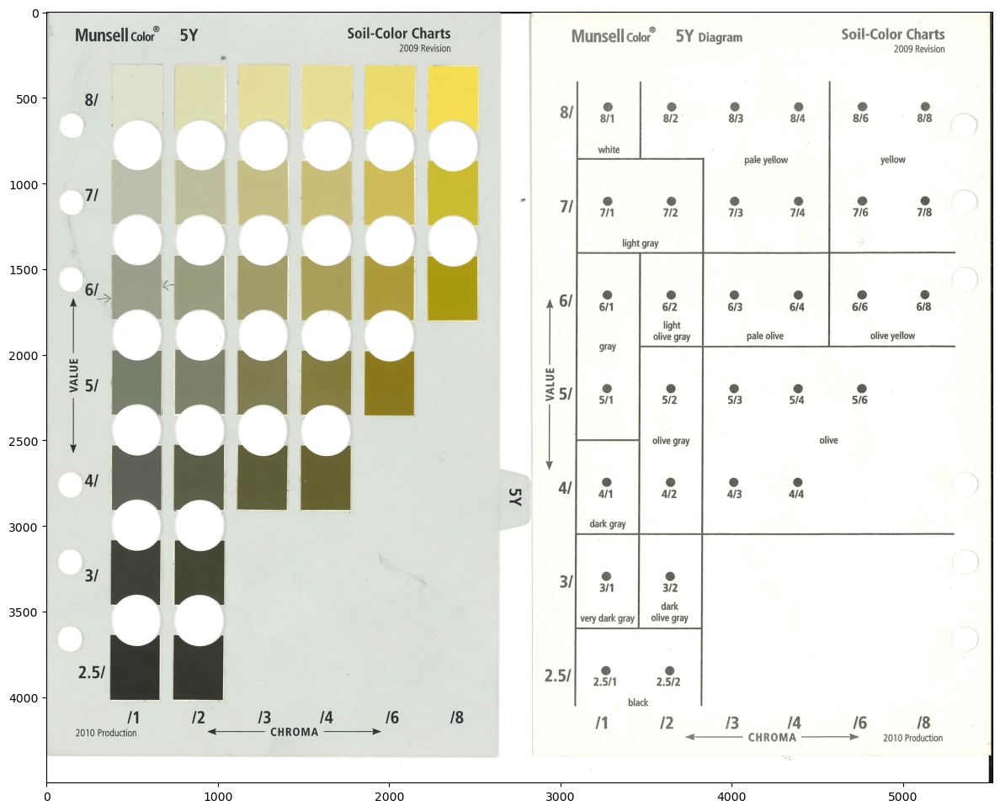

In [18]:
fig,ax=plt.subplots(figsize=(9.2*1.3,7.5*1.3))
ax.imshow(palettes['5Y']['RGB'])
plt.tight_layout()

#### Square Boundaries

In [19]:
w=240
wstarts=[420,775,1150,1520,1880,2250]
widths=[tuple((n,n+w)) for n in wstarts]

In [20]:
h=210
hstarts=[350,940,1500,2050,2600,3150,3740]
heights=[tuple((n,n+w)) for n in hstarts]

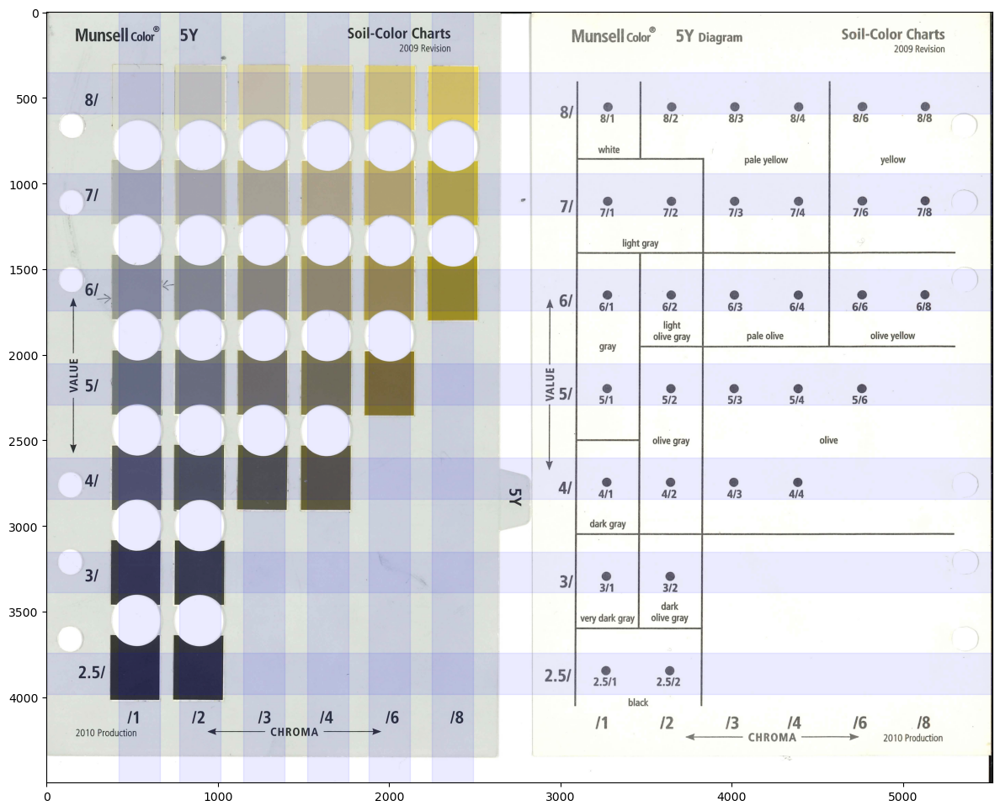

In [21]:
fig,ax=plt.subplots(figsize=(9.2*1.3,7.5*1.3))
ax.imshow(palettes['5Y']['RGB'])
for height in heights:
    ax.axhspan(ymin=height[0],ymax=height[1],color='b',alpha=.08)
for width in widths:
    ax.axvspan(xmin=width[0],xmax=width[1],color='b',alpha=.08)
plt.tight_layout()

#### Take average and store results

In [22]:
palettes['5Y']['Values']=np.zeros((7,6,3))

In [23]:
for i,height in enumerate(heights):
    for j,width in enumerate(widths):
        palettes['5Y']['Values'][i,j]=palettes['5Y']['HSV'][height[0]:
                                                            height[1],
                                                            width[0]:
                                                            width[1]].mean(axis=0).mean(axis=0).astype(int)

In [24]:
palettes['5Y']['Names']=['white 5Y 8/1','pale yellow 5Y 8/2','pale yellow 5Y 8/3',
                         'pale yellow 5Y 8/4','yellow 5Y 8/6','yellow 5Y 8/8',
                         
                         'light gray 5Y 7/1','light gray 5Y 7/2','pale yellow 5Y 7/3',
                         'pale yellow 5Y 7/4','yellow 5Y 7/6','yellow 5Y 7/8',
                         
                         'gray 5Y 6/1','light olive gray 5Y 6/2','pale olive 5Y 6/3',
                         'pale olive 5Y 6/4','olive yellow 5Y 6/6','olive yellow 5Y 6/8',
                         
                         'gray 5Y 5/1','olive gray 5Y 5/2','olive 5Y 5/3',
                         'olive 5Y 5/4','olive 5Y 5/6','',
                         
                         'dark gray 5Y 4/1','olive gray 5Y 4/2','olive 5Y 4/3',
                         'olive 5Y 4/4','','',
                         
                         'very dark gray 5Y 3/1','dark olive brown 5Y 3/2','','','','',
                         
                         'black 5Y 2.5/1','black 5Y 2.5/2','','','','']

In [25]:
flatYs5=palettes['5Y']['Values'].reshape(42,3)

In [26]:
flatYs5df=pd.DataFrame({'H':flatYs5[:,0],'S':flatYs5[:,1],'V':flatYs5[:,2],
                          'Name':palettes['5Y']['Names']})

### 10Y-5GY

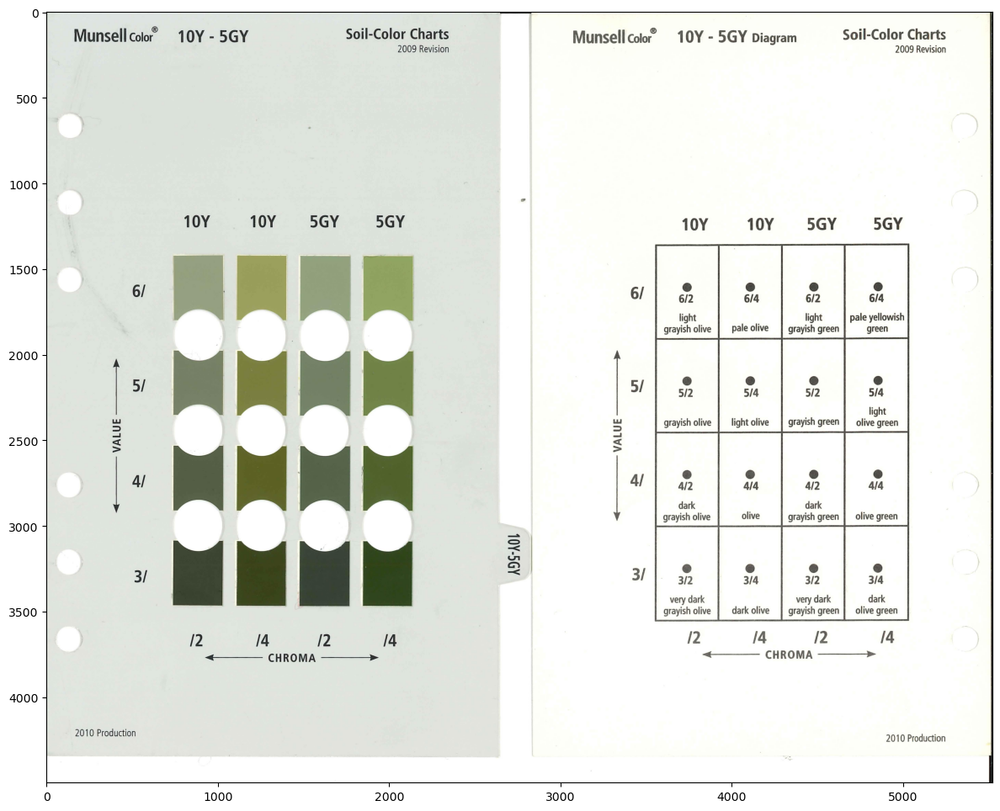

In [27]:
fig,ax=plt.subplots(figsize=(9.2*1.3,7.5*1.3))
ax.imshow(palettes['10Y-5GY']['RGB'])
plt.tight_layout()

#### Square Boundaries

In [28]:
w=240
wstarts=[770,1135,1510,1870]
widths=[tuple((n,n+w)) for n in wstarts]

In [29]:
h=210
hstarts=[1450,2050,2600,3190]
heights=[tuple((n,n+w)) for n in hstarts]

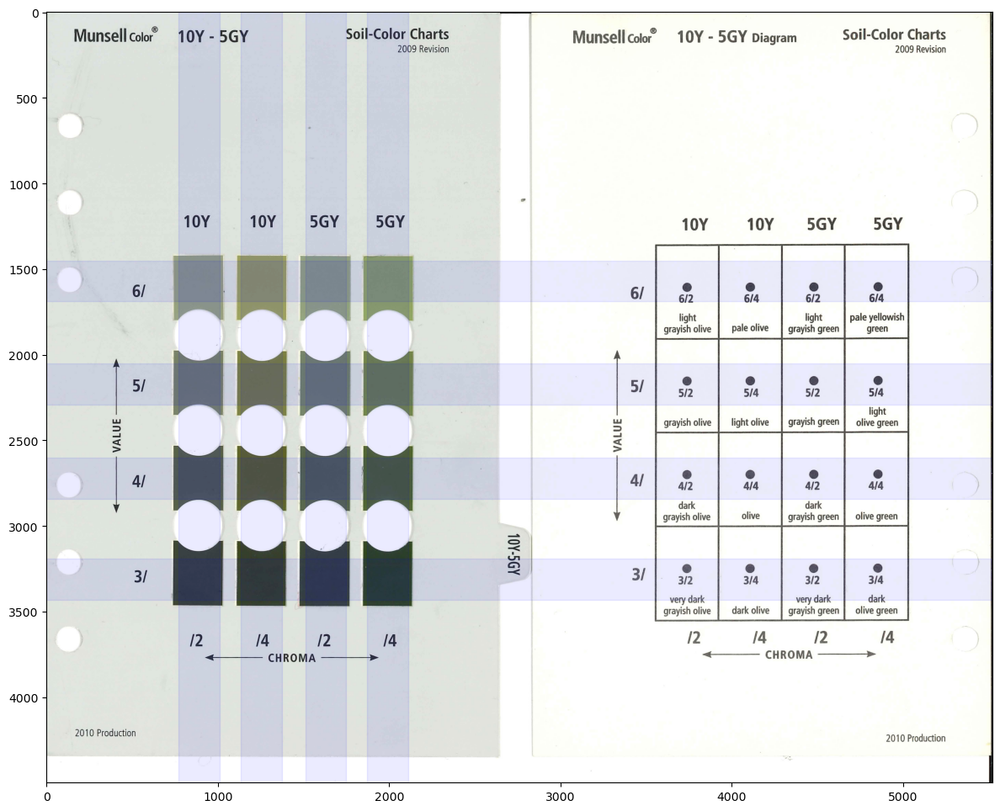

In [30]:
fig,ax=plt.subplots(figsize=(9.2*1.3,7.5*1.3))
ax.imshow(palettes['10Y-5GY']['RGB'])
for height in heights:
    ax.axhspan(ymin=height[0],ymax=height[1],color='b',alpha=.08)
for width in widths:
    ax.axvspan(xmin=width[0],xmax=width[1],color='b',alpha=.08)
plt.tight_layout()

#### Take average and store results

In [31]:
palettes['10Y-5GY']['Values']=np.zeros((4,4,3))

In [32]:
for i,height in enumerate(heights):
    for j,width in enumerate(widths):
        palettes['10Y-5GY']['Values'][i,j]=palettes['10Y-5GY']['HSV'][height[0]:height[1],
                                                                      width[0]:width[1]
                                                                     ].mean(axis=0).mean(axis=0).astype(int)

In [33]:
palettes['10Y-5GY']['Names']=['light grayish olive 10Y 6/2','pale olive 10Y 6/4',
                              'light grayish olive 5G 6/2','pale yellowish green 5G 6/4',
                              
                              'grayish olive 10Y 5/2','light olive 10Y 5/4',
                              'grayish green 5G 5/2','light olive green 5G 5/4',
                              
                              'dark grayish olive 10Y 4/2','olive 10Y 4/4',
                              'dark grayish green 5G 4/2','olive green 5G 4/4',
                              
                              'very dark grayish olive 10Y 3/2','dark olive 10Y 3/4',
                              'very dark grayish green 5G 3/2','dark olive green 5G 3/4']

In [34]:
flatGYs=palettes['10Y-5GY']['Values'].reshape(16,3)

In [35]:
flatGYsdf=pd.DataFrame({'H':flatGYs[:,0],'S':flatGYs[:,1],'V':flatGYs[:,2],
                          'Name':palettes['10Y-5GY']['Names']})

### GLEY1

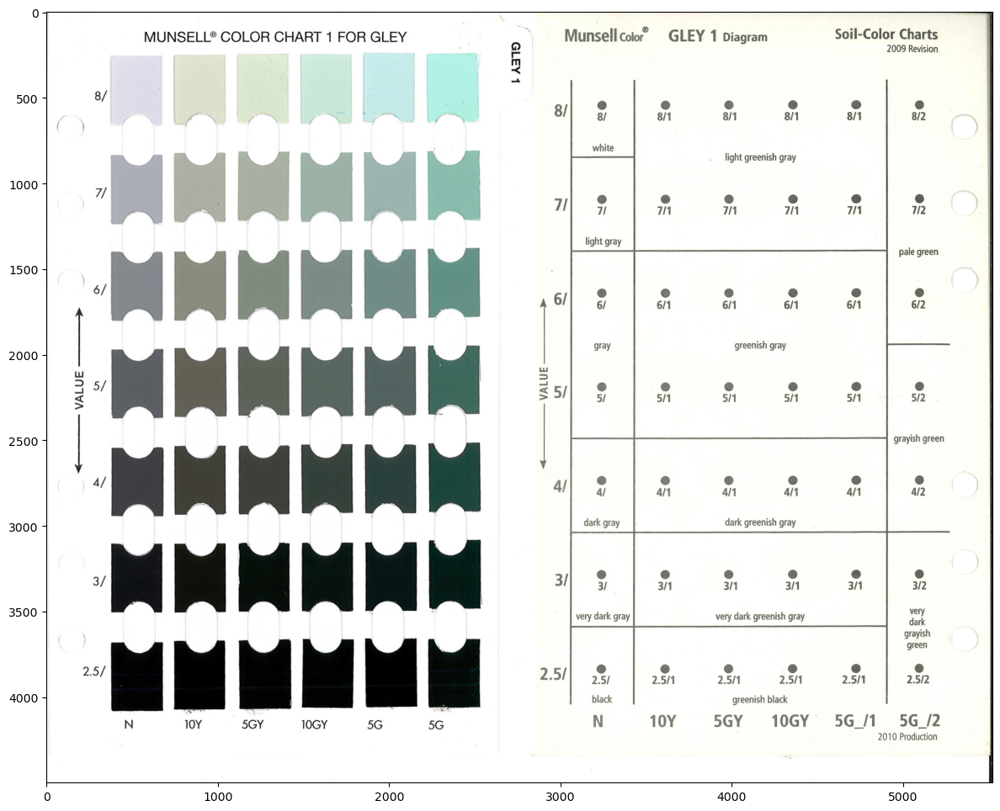

In [36]:
fig,ax=plt.subplots(figsize=(9.2*1.3,7.5*1.3))
ax.imshow(palettes['GLEY1']['RGB'])
plt.tight_layout()

#### Square Boundaries

In [37]:
w=240
wstarts=[400,775,1150,1520,1880,2250]
widths=[tuple((n,n+w)) for n in wstarts]

In [38]:
h=210
hstarts=[330,910,1480,2050,2620,3190,3760]
heights=[tuple((n,n+w)) for n in hstarts]

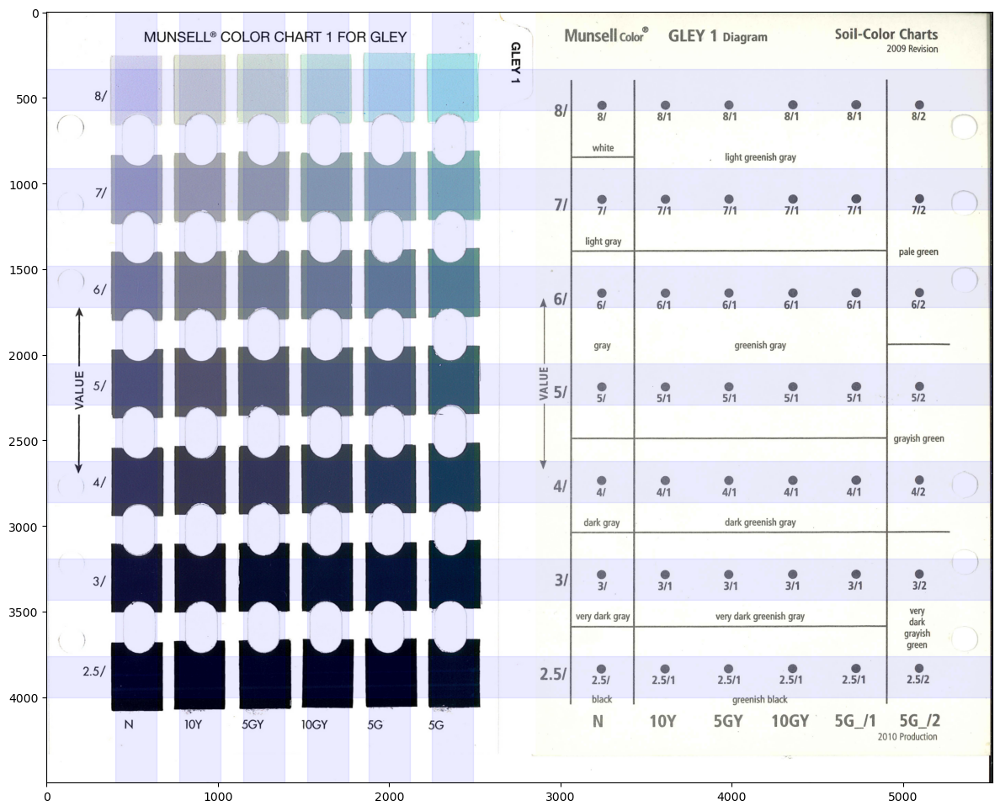

In [39]:
fig,ax=plt.subplots(figsize=(9.2*1.3,7.5*1.3))
ax.imshow(palettes['GLEY1']['RGB'])
for height in heights:
    ax.axhspan(ymin=height[0],ymax=height[1],color='b',alpha=.08)
for width in widths:
    ax.axvspan(xmin=width[0],xmax=width[1],color='b',alpha=.08)
plt.tight_layout()

#### Take average and store results

In [40]:
palettes['GLEY1']['Values']=np.zeros((7,6,3))

In [41]:
for i,height in enumerate(heights):
    for j,width in enumerate(widths):
        palettes['GLEY1']['Values'][i,j]=palettes['GLEY1']['HSV'][height[0]:height[1],
                                                                      width[0]:width[1]
                                                                     ].mean(axis=0).mean(axis=0).astype(int)

In [42]:
palettes['GLEY1']['Names']=['white N 8/','light greenish gray 10Y 8/1','light greenish gray 5GY 8/1',
                            'light greenish gray 10GY 8/1','light greenish gray 5G_/1 8/1','pale green 5G_/2 8/2',
                            
                            'white N 7/','light greenish gray 10Y 7/1','light greenish gray 5GY 7/1',
                            'light greenish gray 10GY 7/1','light greenish gray 5G_/1 7/1','pale green 5G_/2 7/2',
                           
                            'gray N 6/','greenish gray 10Y 6/1','greenish gray 5GY 6/1',
                            'greenish gray 10GY 6/1','greenish gray 5G_/1 6/1','pale green 5G_/2 6/2',
                           
                            'gray N 5/','greenish gray 10Y 5/1','greenish gray 5GY 5/1',
                            'greenish gray 10GY 5/1','greenish gray 5G_/1 5/1','grayish green 5G_/2 5/2',
                           
                            'dark gray N 4/','greenish gray 10Y 4/1','greenish gray 5GY 4/1',
                            'greenish gray 10GY 4/1','greenish gray 5G_/1 4/1','grayish green 5G_/2 4/2',
                           
                            'very dark gray N 3/','very dark greenish gray 10Y 3/1',
                            'very dark greenish gray 5GY 3/1','very dark greenish gray 10GY 3/1',
                            'very dark greenish gray 5G_/1 3/1','very dark grayish green 5G_/2 3/2',
                           
                            'black N 2.5/','greenish black 10Y 2.5/1','greenish black 10GY 5/1',
                            'greenish black 10GY 2.5/1','greenish black 5G_/1 2.5/1',
                            'very dark grayish green 5G_/2 2.5/2']

In [43]:
flatGLEYs=palettes['GLEY1']['Values'].reshape(42,3)

In [44]:
flatGLEYsdf=pd.DataFrame({'H':flatGLEYs[:,0],'S':flatGLEYs[:,1],'V':flatGLEYs[:,2],
                          'Name':palettes['GLEY1']['Names']})

### Store results of color extraction

In [45]:
munsell=pd.concat([flatYs2p5df,flatYs5df,flatGYsdf,flatGLEYsdf])
munsell=munsell.set_index('Name')

### Select Greens and Olives
The above code took the average of all of these squares but we are only interested in colors that have green or olive in the name

In [47]:
targetNames=['green','olive']
remove=['brown','yellow','black']

In [48]:
ids=[]
for n in targetNames:
    ids.append([s for s in munsell.index.tolist() if n in s])
ids = [item for sublist in ids for item in sublist]
ids=list(set(ids))
for color in remove:
    ids=[x for x in ids if color not in x]

In [49]:
munsellGreens=munsell.loc[ids].reset_index()

In [50]:
munsellGreens['Munsell Hue']=munsellGreens['Name'].str.rsplit().str[-2]
munsellGreens['Munsell Value']=munsellGreens['Name'].str.rsplit('/').str[-2].str[-1]
munsellGreens['Munsell Chroma']=munsellGreens['Name'].str.rsplit('/').str[-1]
munsellGreens['Munsell Name']=[' '.join(i) for i in munsellGreens['Name'].str.split(' ').str[:-2]]

In [51]:
# munsellGreens=munsellGreens.drop([2,8,53])

### Convert to RGB
If we ever want to see the colors of this, python plotting software uses RGB, so we have to take these HSV values and convert them back for that purpose. The package colorsys can do the conversion if we make the HSV values a decimal value between 0-1.

In [52]:
munsellGreens['Hn']=None
munsellGreens['Sn']=None
munsellGreens['Vn']=None
munsellGreens[['Hn','Sn','Vn']]=munsellGreens[['H','S','V']]/np.array([255,255,255])

In [53]:
rgbcolors=[colorsys.hsv_to_rgb(munsellGreens.loc[c,'Hn'],
                               munsellGreens.loc[c,'Sn'],
                               munsellGreens.loc[c,'Vn']) for c in munsellGreens.index]

In [54]:
munsellGreens['RGB']=rgbcolors
munsellGreens['index']=munsellGreens.index.astype(str)

In [55]:
munsellGreens['Ho']=munsellGreens['H']/255*360
munsellGreens['S%']=munsellGreens['S']/255*100
munsellGreens['V%']=munsellGreens['V']/255*100

In [56]:
munsellGreens['Hue Group']=np.round(munsellGreens['Ho']/5)*5

In [57]:
bad_olive_id=munsellGreens[munsellGreens['Name']=='olive 5Y 5/6'].index
munsellGreens=munsellGreens.drop(bad_olive_id)

In [58]:
munsellGreensH=munsellGreens.set_index('Hue Group')

### Visualize results

#### 3D, interactive view plotly
You can move your view of this data plotted in the cylinder. If you hover over a point, it will tell you what the name of the color is according to Munsell.

In [59]:
from matplotlib.colors import rgb2hex
hexes=[rgb2hex(rgb) for rgb in rgbcolors]

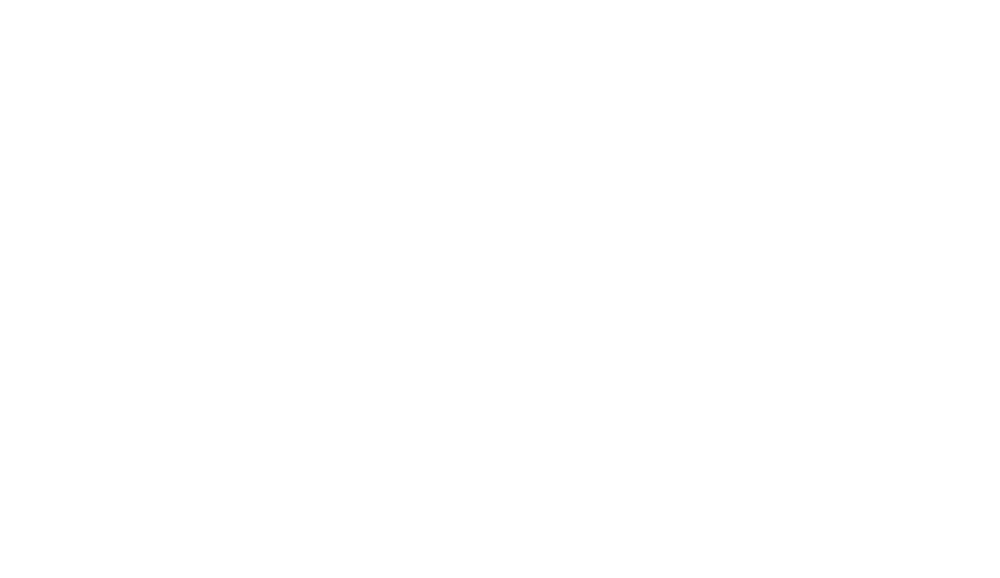

In [60]:
import plotly.express as px
import plotly.graph_objects as go

fig=go.Figure(data=[
                    go.Scatter3d(x=munsellGreens['Ho'],y=munsellGreens['S%'],
                                 z=munsellGreens['V%'],text=munsellGreens['Name'],
                                 hovertemplate='<b>%{text}</b><extra></extra>',mode='markers',
                                marker=dict(color=munsellGreens['RGB'])),
                     ])
fig.update_layout(scene = dict(xaxis_title='Hue',
                               yaxis_title='Saturation',
                               zaxis_title='Value'),
                  scene_camera=dict(up=dict(x=0, y=0, z=1),
                                    center=dict(x=0, y=-.2, z=-.2),
                                    eye=dict(x=3/1.65, y=1.1/1.65, z=.5/1.65)),
                  width=900/4*3,
                  height=800/4*3,
                  margin=dict(r=10, b=10, l=10, t=10))
fig.show()

## Define green color channels

In [61]:
def make_box(inside_corner,width1,width2,height):
    xmin,ymin,zmin=inside_corner
    x=[xmin,xmin,xmin+width1,xmin+width1,xmin,xmin,xmin+width1,xmin+width1]
    y=[ymin,ymin+width2,ymin+width2,ymin,ymin,ymin+width2,ymin+width2,ymin]
    z=[zmin,zmin,zmin,zmin,zmin+height,zmin+height,zmin+height,zmin+height]
    return([x,y,z])

### Set range for side profile

In [63]:
g_slc=[[0,0,0,1,1,1,1,1,1,0], #0
      [0,0,0,1,1,1,1,1,1,0], #10
      [1,1,1,1,1,1,1,0,0,0],
      [1,1,1,1,1,1,1,0,0,0], #30
      [1,1,1,1,1,1,1,0,0,0],
      [1,1,1,1,1,1,0,0,0,0], #50
      [1,1,1,1,1,0,0,0,0,0],
      [1,1,1,1,1,0,0,0,0,0],
      [1,1,1,1,0,0,0,0,0,0],
      [1,1,1,1,0,0,0,0,0,0]]
g_slc=np.array(g_slc).transpose().tolist()

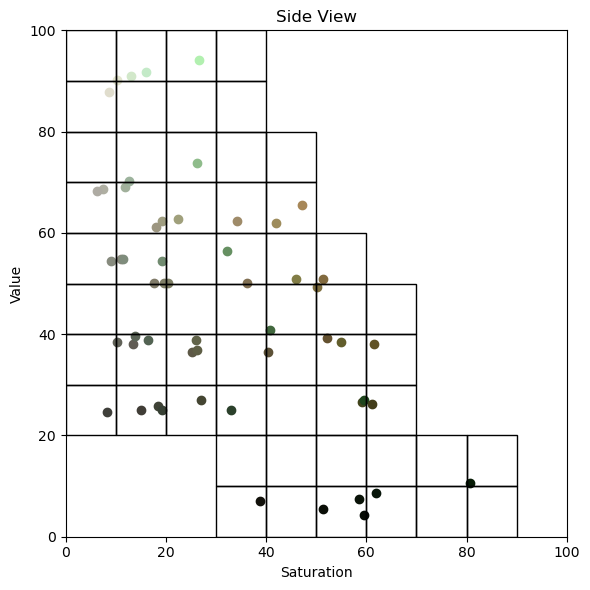

In [64]:
fig,ax=plt.subplots(figsize=(6,6))
for i,c in enumerate(munsellGreens.index):
    ax.scatter(munsellGreens.loc[c,'S%'],munsellGreens.loc[c,'V%'],marker='o',color=munsellGreens.loc[c,'RGB'])
ax.set_ylabel('Value')
ax.set_xlabel('Saturation')
ax.set_title('Side View')
ax.set_xlim(0,100)
ax.set_ylim(0,100)

rects=[]
for i,y in enumerate(g_slc):
    for j,z in enumerate(y):
        if z==1:
            rects.append(patches.Rectangle((i*10, j*10),10,10,linewidth=1,edgecolor='k',facecolor='none'))

# Add the patch to the Axes
for r in rects:
    ax.add_patch(r)

plt.tight_layout()

### All channels tested
#### Set range

In [65]:
g_hs=np.arange(30,140,10,dtype=int)
g_ss=np.arange(0,100,10,dtype=int)
g_vs=np.arange(0,100,10,dtype=int)

#### Make boxes

In [66]:
green_boxes=np.empty((len(g_hs),len(g_ss),len(g_vs),3,8))
for i,h in enumerate(g_hs):
    for j,s in enumerate(g_ss):
        for k,v in enumerate(g_vs):
            if g_slc[j][k]==1:
                green_boxes[i,j,k]=make_box(tuple((h,s,v)),9.99,9.99,9.99)
            else:
                green_boxes[i,j,k]=0

#### Make plotly objects

In [67]:
import plotly.express as px
import plotly.graph_objects as go

def get_color(boxname):
    h=np.mean(green_boxes[i,j,k][0])
    s=np.mean(green_boxes[i,j,k][1])
    v=np.mean(green_boxes[i,j,k][2])
    return 'hsv('+str(h)+','+str(s)+','+str(v)+')'

g_gos={}
for i,h in enumerate(g_hs):
    for j,s in enumerate(g_ss):
        for k,v in enumerate(g_vs):
            key=str(h)+'-'+str(s)+'-'+str(v)
            g_gos[key]=go.Mesh3d(x=green_boxes[i,j,k][0],y=green_boxes[i,j,k][1],
                               z=green_boxes[i,j,k][2],color=get_color(key),
                       # i, j and k give the vertices of triangles
                       i = [7, 0, 0, 0, 4, 4, 6, 6, 4, 0, 3, 2],
                       j = [3, 4, 1, 2, 5, 6, 5, 2, 0, 1, 6, 3],
                       k = [0, 7, 2, 3, 6, 7, 1, 1, 5, 5, 7, 6],
                       hoverinfo='skip',
                       opacity=.05,
                       showscale=True)
g_all_list=list(g_gos.values())

In [68]:
scatter=go.Scatter3d(x=munsellGreens['Ho'],y=munsellGreens['S%'],
                                 z=munsellGreens['V%'],text=munsellGreens['Name'],
#                                  hovertemplate='<b>%{text}</b><extra></extra>',
                                 mode='markers',
                                 marker=dict(color=munsellGreens['RGB']))

#### Make figure

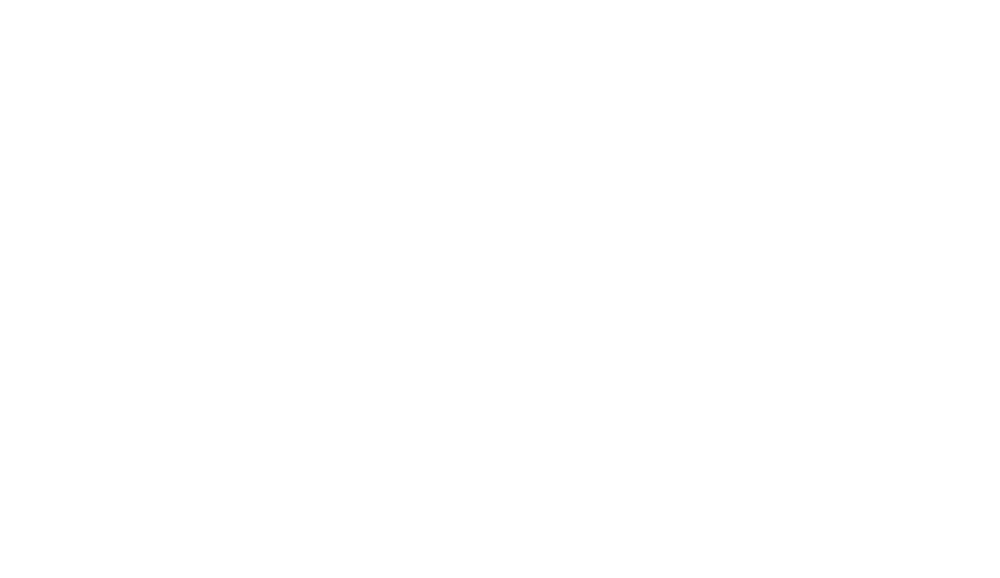

In [69]:
fig=go.Figure(data=g_all_list+[scatter])
fig.update_layout(scene = dict(xaxis_title='Hue',
                               yaxis_title='Saturation',
                               zaxis_title='Value'),
                  scene_camera=dict(up=dict(x=0, y=0, z=1),
                                    center=dict(x=0, y=-.2, z=-.2),
                                    eye=dict(x=3/1.65, y=1.1/1.65, z=.5/1.65)),
                  width=900/4*3,
                  height=800/4*3,
                  margin=dict(r=10, b=10, l=10, t=10))
fig.show()
fig.write_image(sup_figure_path+"Extended Data Figure 4 - Color channels tested for sensitivity to green bands.png")

### Green channels selected for U1474

In [70]:
g_gos={}
for i,h in enumerate(g_hs):
    for j,s in enumerate(g_ss):
        for k,v in enumerate(g_vs):
            key=str(h)+'-'+str(s)+'-'+str(v)
            g_gos[key]=go.Mesh3d(x=green_boxes[i,j,k][0],y=green_boxes[i,j,k][1],
                               z=green_boxes[i,j,k][2],color=get_color(key),
                       # i, j and k give the vertices of triangles
                       i = [7, 0, 0, 0, 4, 4, 6, 6, 4, 0, 3, 2],
                       j = [3, 4, 1, 2, 5, 6, 5, 2, 0, 1, 6, 3],
                       k = [0, 7, 2, 3, 6, 7, 1, 1, 5, 5, 7, 6],
                       hoverinfo='skip',
                       opacity=.05,
                       showscale=True)
g_all_list=list(g_gos.values())

In [71]:
g_chosen_chs=['40-30-30','40-30-40',
                     '50-20-30','50-20-40','50-30-20','50-40-20','50-40-30',
                     '60-20-20','60-20-30','60-20-40','60-30-10','60-30-20','60-30-30',
                     '70-10-40','70-10-50','70-20-20','70-20-30','70-20-40','70-30-10',
                     '80-10-20','80-10-30','80-10-40','80-10-50',
                         '80-20-20', '80-20-30', '80-20-40', 
                     '90-0-30','90-0-40','90-0-50','90-10-20','90-10-30','90-10-40','90-10-50',
                         '90-20-20','90-20-30',
                     '100-0-20','100-0-30','100-0-40','100-0-50','100-10-20','100-10-30',
                         '100-10-40','100-20-20','100-20-30',
                     '110-0-30','110-0-40','110-0-50','110-10-20','110-10-30','110-10-40',
                     '120-0-30','120-0-40','120-10-20','120-10-30','120-10-40',
                     '130-0-30','130-0-40','130-10-20','130-10-30','130-10-40']

In [72]:
g_chosen_chs_U1474=g_chosen_chs

In [73]:
g_chosen_chs_gos={}
for i,h in enumerate(g_hs):
    for j,s in enumerate(g_ss):
        for k,v in enumerate(g_vs):
            key=str(h)+'-'+str(s)+'-'+str(v)
            if key in g_chosen_chs:
                g_chosen_chs_gos[key]=go.Mesh3d(x=green_boxes[i,j,k][0],y=green_boxes[i,j,k][1],
                                                z=green_boxes[i,j,k][2],color=get_color(key),
                           # i, j and k give the vertices of triangles
                           i = [7, 0, 0, 0, 4, 4, 6, 6, 4, 0, 3, 2],
                           j = [3, 4, 1, 2, 5, 6, 5, 2, 0, 1, 6, 3],
                           k = [0, 7, 2, 3, 6, 7, 1, 1, 5, 5, 7, 6],
                           hoverinfo='skip',
                           opacity=.9,
                           showscale=True)
g_chosen_chs_gos_list=list(g_chosen_chs_gos.values())

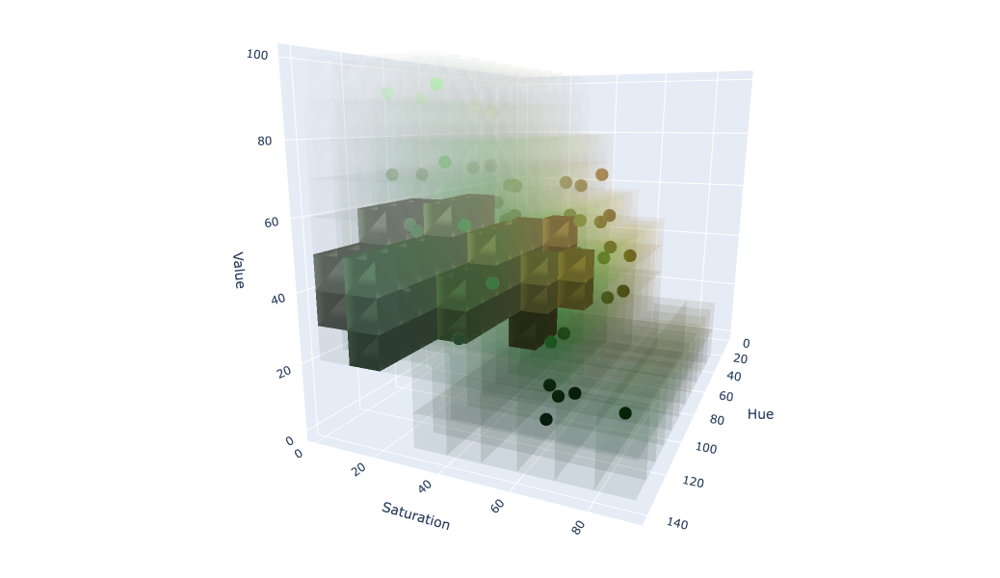

In [75]:
fig=go.Figure(data=[scatter]+g_all_list+g_chosen_chs_gos_list)
fig.update_layout(scene = dict(xaxis_title='Hue',
                               yaxis_title='Saturation',
                               zaxis_title='Value'),
                  scene_camera=dict(up=dict(x=0, y=0, z=1),
                                    center=dict(x=0, y=-.2, z=-.2),
                                    eye=dict(x=3/1.65, y=1.1/1.65, z=.5/1.65)),
                  width=900/4*3,
                  height=800/4*3,
                  margin=dict(r=10, b=10, l=10, t=10))
fig.show()
fig.write_image(sup_figure_path+"Extended Data Figure 6A - Tested and selected channels for Site U1474.png")

### Green channels for U1313

In [76]:
g_chosen_chs=['60-10-30','60-10-40','60-20-20','60-20-30','60-20-40','60-30-10',
                     '70-10-20','70-10-30','70-10-40','70-10-50','70-20-20','70-20-30','70-20-40','70-30-10',
                     '80-10-20','80-10-30','80-10-40','80-10-50','80-10-60','80-10-70','80-10-80',
                         '80-20-20', '80-20-30', '80-20-40', 
                     '90-0-30','90-0-40','90-0-50','90-0-60','90-0-70','90-0-80',
                         '90-10-20','90-10-30','90-10-40','90-10-50',
                         '90-20-20','90-20-30',
                     '100-0-20','100-0-30','100-0-40','100-0-50','100-10-20','100-10-30',
                         '100-10-40','100-20-20','100-20-30',
                     '110-0-30','110-0-40','110-0-50','110-10-20','110-10-30','110-10-40',
                     '120-0-30','120-0-40','120-0-50','120-0-60','120-0-70','120-0-80',
                         '120-10-20','120-10-30','120-10-40',
                     '130-0-30','130-0-40','130-0-50','130-0-60','130-0-70','130-0-80',
                         '130-10-20','130-10-30','130-10-40']

In [77]:
g_chosen_chs_1313=g_chosen_chs

In [78]:
g_chosen_chs_gos={}
for i,h in enumerate(g_hs):
    for j,s in enumerate(g_ss):
        for k,v in enumerate(g_vs):
            key=str(h)+'-'+str(s)+'-'+str(v)
            if key in g_chosen_chs:
                g_chosen_chs_gos[key]=go.Mesh3d(x=green_boxes[i,j,k][0],y=green_boxes[i,j,k][1],
                                                z=green_boxes[i,j,k][2],color=get_color(key),
                           # i, j and k give the vertices of triangles
                           i = [7, 0, 0, 0, 4, 4, 6, 6, 4, 0, 3, 2],
                           j = [3, 4, 1, 2, 5, 6, 5, 2, 0, 1, 6, 3],
                           k = [0, 7, 2, 3, 6, 7, 1, 1, 5, 5, 7, 6],
                           hoverinfo='skip',
                           opacity=.9,
                           showscale=True)
g_chosen_chs_gos_list=list(g_chosen_chs_gos.values())

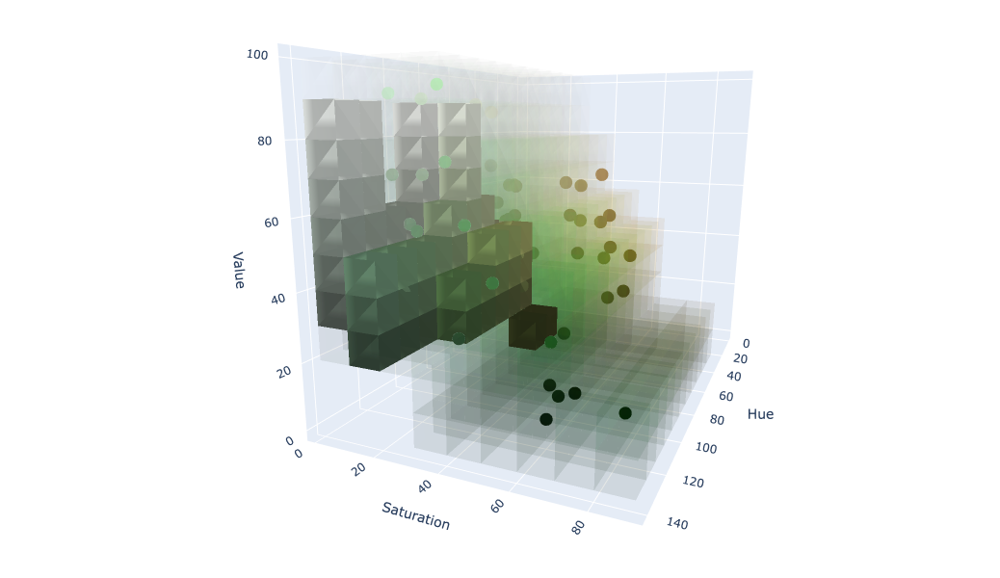

In [80]:
fig=go.Figure(data=[scatter]+g_all_list+g_chosen_chs_gos_list)
fig.update_layout(scene = dict(xaxis_title='Hue',
                               yaxis_title='Saturation',
                               zaxis_title='Value'),
                  scene_camera=dict(up=dict(x=0, y=0, z=1),
                                    center=dict(x=0, y=-.2, z=-.2),
                                    eye=dict(x=3/1.65, y=1.1/1.65, z=.5/1.65)),
                  width=900/4*3,
                  height=800/4*3,
                  margin=dict(r=10, b=10, l=10, t=10))
fig.show()
fig.write_image(sup_figure_path+"Extended Data Figure 6B - Tested and selected channels for Site 1313.png")

## Aggregate and export

In [81]:
green_groups=pd.DataFrame(columns=['Code','Hmin','Hmax','Smin','Smax','Vmin','Vmax','Kind'])
count=0
for i,h in enumerate(g_hs):
    for j,s in enumerate(g_ss):
        for k,v in enumerate(g_vs):
            if g_slc[j][k]==1:
                count=count+1
                idn=str(h)+'-'+str(s)+'-'+str(v)
                green_groups.loc[count,['Code','Hmin','Hmax','Smin','Smax',
                                  'Vmin','Vmax','Kind']]=[idn,h,h+9.9,s,s+9.9,v,v+9.9,'Green']

In [82]:
selected_ids=green_groups.loc[green_groups['Code'].isin(pd.Series(g_chosen_chs_U1474))].index
green_groups['U1474']=False
green_groups.loc[selected_ids,'U1474']=True

selected_ids=green_groups.loc[green_groups['Code'].isin(pd.Series(g_chosen_chs_1313))].index
green_groups['1313']=False
green_groups.loc[selected_ids,'1313']=True

In [83]:
green_groups=green_groups.sort_values(by=['Hmin','Smin','Vmin'])

In [84]:
green_groups=green_groups.drop('Kind',axis=1)

In [86]:
green_groups.to_csv(table_path+'Supplementary Table 4 - Green channels.csv',index=False)